In [1]:
#!pip install esda
!pip install splot

In [2]:
import pandas as pd

import geopandas as gpd

import contextily as ctx

import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

import matplotlib.pyplot as plt

import plotly.express as px

import seaborn as sns

In [3]:
Smallplex_Data = gpd.read_file('Smallplex Data New.csv')

In [4]:
Neighborhood_Boundaries = gpd.read_file('LA_Times_Neighborhood_Boundaries.zip')

In [5]:
Smallplex_Data.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 16002 entries, 0 to 16001
Data columns (total 9 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   Permit Type             16002 non-null  object  
 1   Initiating Office       16002 non-null  object  
 2   Issue Datw              16002 non-null  object  
 3   Valuation               16002 non-null  object  
 4   # of Residential Units  16002 non-null  object  
 5   Zone                    16002 non-null  object  
 6   Latitude                16002 non-null  object  
 7   Longitude               16002 non-null  object  
 8   geometry                0 non-null      geometry
dtypes: geometry(1), object(8)
memory usage: 1.1+ MB


In [6]:
Smallplex_Data.sample(5)

,Permit Type,Initiating Office,Issue Datw,Valuation,# of Residential Units,Zone,Latitude,Longitude,geometry
15321,Bldg-New,SOUTH LA,2/28/2020,361000,2,[Q]R3-1-O,34.02663,-118.2983,None
10643,Bldg-Addition,METRO,6/29/2018,55000,1,RD2-1,34.0031,-118.25319,None
5505,Bldg-New,SOUTH LA,3/19/2015,194000,1,RD2-1,33.97375,-118.28855,None
2967,Bldg-New,WEST LA,7/31/2013,540000,1,R1-1-O,34.04392,-118.42486,None
4322,Bldg-New,VAN NUYS,3/23/2015,1800000,1,RE11-1,34.05327,-118.50434,None


In [7]:
Smallplex_Data_With_Geometry = gpd.GeoDataFrame(Smallplex_Data,
                                                crs='epsg:4326',
                                                geometry= gpd.points_from_xy(Smallplex_Data.Longitude, Smallplex_Data.Latitude))

In [8]:
Smallplex_Data_With_Geometry.sample(5)

,Permit Type,Initiating Office,Issue Datw,Valuation,# of Residential Units,Zone,Latitude,Longitude,geometry
4918,Bldg-New,METRO,2/10/2014,800000,1,R1-1,34.13971,-118.39224,POINT (-118.39224 34.13971)
7347,Bldg-New,WEST LA,7/12/2016,500000,1,R1-1-RFA-RIO,34.15339,-118.40718,POINT (-118.40718 34.15339)
447,Bldg-New,VAN NUYS,7/10/2020,632845,1,[T]RE-1,34.28331,-118.5785,POINT (-118.57850 34.28331)
3967,Bldg-New,SOUTH LA,9/10/2013,230000,1,R2-1,33.99171,-118.25801,POINT (-118.25801 33.99171)
1550,Bldg-New,VAN NUYS,10/4/2016,290000,1,(T)(Q)RD3-1,34.23556,-118.60629,POINT (-118.60629 34.23556)


In [9]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [10]:
Smallplex_Data_With_Geometry['Latitude'] = Smallplex_Data_With_Geometry.Latitude.astype(float)
Smallplex_Data_With_Geometry['Longitude'] = Smallplex_Data_With_Geometry.Longitude.astype(float)

In [11]:
Smallplex_Data_With_Geometry = Smallplex_Data_With_Geometry.to_crs(epsg=4326)

<AxesSubplot:>

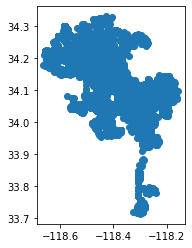

In [12]:
Smallplex_Data_With_Geometry.plot()

In [13]:
Neighborhood_Boundaries.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 114 entries, 0 to 113
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   OBJECTID  114 non-null    int64   
 1   name      114 non-null    object  
 2   geometry  114 non-null    geometry
dtypes: geometry(1), int64(1), object(1)
memory usage: 2.8+ KB


In [14]:
Neighborhood_Boundaries.sample(5)

,OBJECTID,name,geometry
17,18,Chatsworth Reservoir,"POLYGON ((-118.62020 34.23883, -118.61971 34.2..."
25,26,East Hollywood,"POLYGON ((-118.28740 34.09836, -118.28740 34.0..."
88,89,Sun Valley,"POLYGON ((-118.39006 34.25221, -118.36649 34.2..."
35,36,Gramercy Park,"POLYGON ((-118.30041 33.95002, -118.30073 33.9..."
21,22,Cypress Park,"POLYGON ((-118.21903 34.08902, -118.21823 34.0..."


In [15]:
columns_to_keep_2 = ['name',
                     'geometry']

In [16]:
Neighborhood_Boundaries = Neighborhood_Boundaries[columns_to_keep_2]

In [17]:
Neighborhood_Boundaries

,name,geometry
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0..."
1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2..."
2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0..."
3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788..."
4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0..."
5,Bel-Air,"POLYGON ((-118.46165 34.13077, -118.46077 34.1..."
6,Beverly Crest,"POLYGON ((-118.42910 34.07920, -118.42929 34.0..."
7,Beverly Grove,"POLYGON ((-118.37251 34.09026, -118.37250 34.0..."
8,Beverlywood,"POLYGON ((-118.38609 34.04675, -118.38934 34.0..."
9,Boyle Heights,"POLYGON ((-118.19263 34.06077, -118.19260 34.0..."


<AxesSubplot:>

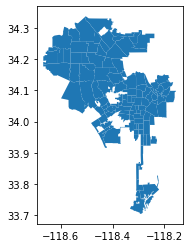

In [18]:
Neighborhood_Boundaries.plot()

In [19]:
Neighborhood_Boundaries = Neighborhood_Boundaries.to_crs(epsg=4326)

C:\Users\trong\anaconda3\envs\environment\lib\site-packages\contextily\tile.py:581: UserWarning: The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


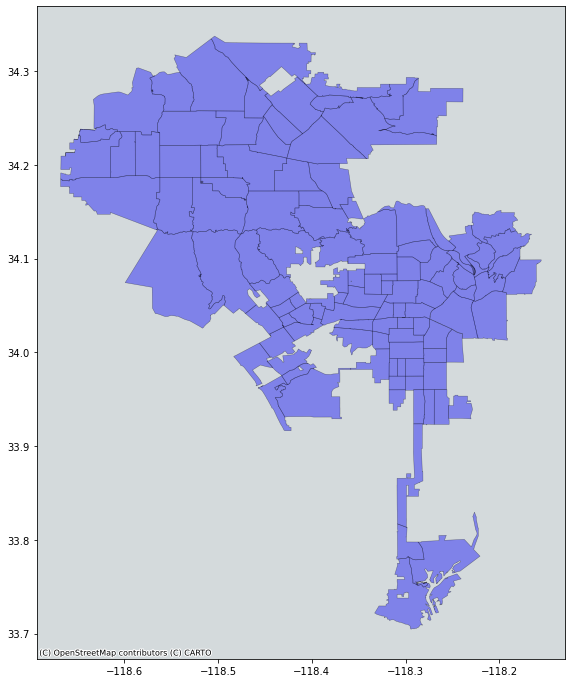

In [20]:
fig, ax = plt.subplots(figsize=(12,12))

Neighborhood_Boundaries.plot(ax=ax,
         color='blue', 
         edgecolor='black',
         lw=0.5,
         alpha=0.4)

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

C:\Users\trong\anaconda3\envs\environment\lib\site-packages\contextily\tile.py:581: UserWarning: The inferred zoom level of 28 is not valid for the current tile provider (valid zooms: 0 - 20).
  warnings.warn(msg)


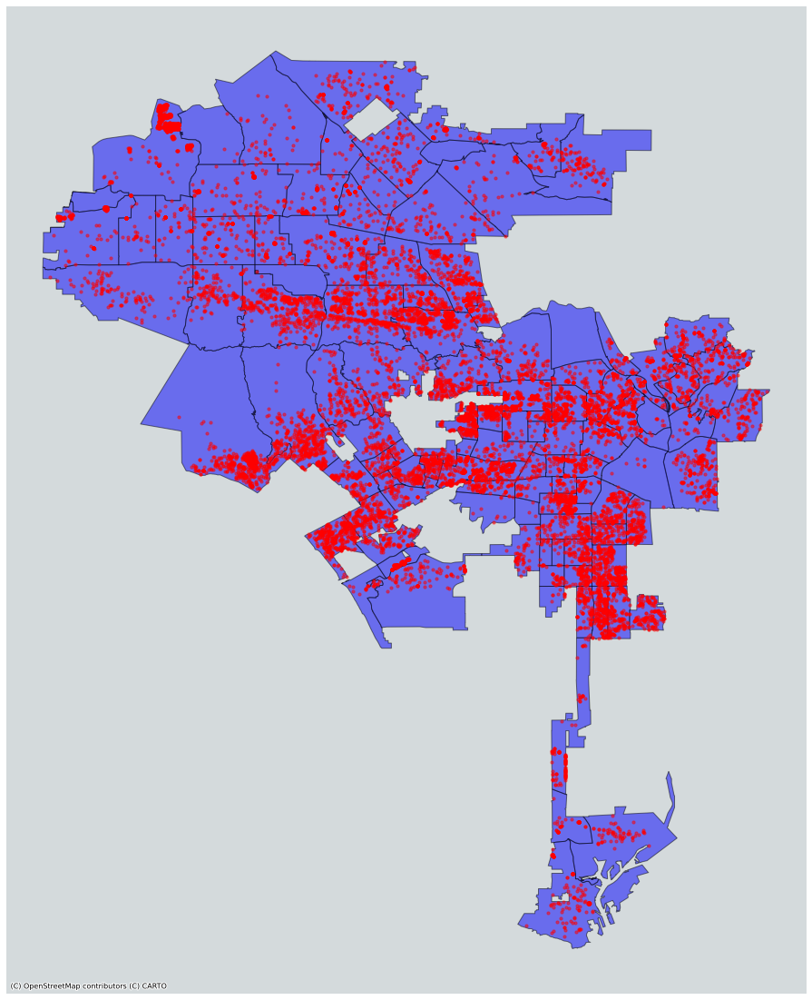

In [21]:
fig, ax = plt.subplots(figsize=(20, 20))

Neighborhood_Boundaries.plot(ax=ax,
        color='blue', 
        edgecolor='black',
        alpha=0.5)

Smallplex_Data_With_Geometry.plot(ax=ax,
            color='red',
            markersize=10,
            alpha=0.5)


ax.axis('off')

ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

In [22]:
Combined_Data = gpd.sjoin(Smallplex_Data_With_Geometry, Neighborhood_Boundaries,how='left')

Combined_Data.tail(20)

,Permit Type,Initiating Office,Issue Datw,Valuation,# of Residential Units,Zone,Latitude,Longitude,geometry,index_right,name
15982,Bldg-New,VAN NUYS,2/10/2021,785000,4,RD1.5-1,34.16339,-118.36136,POINT (-118.36136 34.16339),91.0,Toluca Lake
15983,Bldg-New,VAN NUYS,2/10/2021,785000,4,RD1.5-1,34.16349,-118.36136,POINT (-118.36136 34.16349),91.0,Toluca Lake
15984,Bldg-New,METRO,12/20/2017,2601489,4,(Q)RD2-1,34.04951,-118.46995,POINT (-118.46995 34.04951),10.0,Brentwood
15985,Bldg-New,VAN NUYS,6/11/2019,620000,4,RD1.5-1XL,33.73627,-118.30701,POINT (-118.30701 33.73627),79.0,San Pedro
15986,Bldg-New,VAN NUYS,11/7/2018,900000,4,[Q]RD1.5-1,34.18683,-118.44372,POINT (-118.44372 34.18683),96.0,Van Nuys
15987,Bldg-New,VAN NUYS,3/4/2020,1030000,4,R1-1-RIO,34.15506,-118.39670,POINT (-118.39670 34.15506),95.0,Valley Village
15988,Bldg-New,METRO,8/20/2019,12139287,4,R4-1,33.96577,-118.42406,POINT (-118.42406 33.96577),104.0,Westchester
15989,Bldg-New,VAN NUYS,5/18/2021,2000000,4,RD1.5-1VL,34.08981,-118.27802,POINT (-118.27802 34.08981),84.0,Silver Lake
15990,Bldg-New,VAN NUYS,11/7/2017,900000,4,R1-1,34.17768,-118.40552,POINT (-118.40552 34.17768),94.0,Valley Glen
15991,Bldg-New,VAN NUYS,4/8/2016,1320000,4,RD1.5-1,34.19540,-118.39526,POINT (-118.39526 34.19540),66.0,North Hollywood


In [23]:
Smallplexes_By_Neighborhood = Combined_Data.name.value_counts().rename_axis('name').reset_index(name='housing units')

In [24]:
Single_Family_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='1'].name.value_counts().rename_axis('name').reset_index(name='single family')

In [25]:
Duplexes_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='2'].name.value_counts().rename_axis('name').reset_index(name='duplex')

In [26]:
Triplexes_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='3'].name.value_counts().rename_axis('name').reset_index(name='triplex')

In [27]:
Fourplexes_By_Neighborhood = Combined_Data[Combined_Data['# of Residential Units']=='4'].name.value_counts().rename_axis('name').reset_index(name='fourplex')

In [28]:
Smallplexes_By_Neighborhood.head()

,name,housing units
0,Chatsworth,825
1,Mid-City,549
2,Sherman Oaks,493
3,Pacific Palisades,471
4,Studio City,433


In [29]:
Single_Family_By_Neighborhood.head()

,name,single family
0,Chatsworth,810
1,Sherman Oaks,478
2,Pacific Palisades,463
3,Encino,428
4,Studio City,418


In [30]:
Duplexes_By_Neighborhood.head()

,name,duplex
0,Florence,311
1,Mid-City,199
2,Broadway-Manchester,179
3,East Hollywood,177
4,Exposition Park,171


In [31]:
Triplexes_By_Neighborhood.head()

,name,triplex
0,Playa Vista,38
1,Van Nuys,11
2,Boyle Heights,6
3,East Hollywood,6
4,North Hollywood,6


In [32]:
Fourplexes_By_Neighborhood.head()

,name,fourplex
0,North Hollywood,18
1,Sylmar,9
2,Valley Glen,8
3,Chatsworth,7
4,Northridge,7


In [33]:
Neighborhood_Boundaries=Neighborhood_Boundaries.merge(Smallplexes_By_Neighborhood,on='name')

In [34]:
Neighborhood_Boundaries_2=Neighborhood_Boundaries.merge(Triplexes_By_Neighborhood,on='name')

In [35]:
Neighborhood_Boundaries_1=Neighborhood_Boundaries.merge(Duplexes_By_Neighborhood,on='name')

In [36]:
Neighborhood_Boundaries_3=Neighborhood_Boundaries.merge(Fourplexes_By_Neighborhood,on='name')

In [37]:
Neighborhood_Boundaries.sample(5)

,name,geometry,housing units
92,Van Nuys,"POLYGON ((-118.46751 34.22016, -118.46630 34.2...",363
77,Sawtelle,"POLYGON ((-118.44394 34.04720, -118.43526 34.0...",158
38,Harbor City,"POLYGON ((-118.29902 33.80355, -118.29903 33.8...",51
18,Cheviot Hills,"POLYGON ((-118.39888 34.04426, -118.39879 34.0...",127
98,Watts,"POLYGON ((-118.24423 33.95379, -118.24423 33.9...",154


In [38]:
token = 'pk.eyJ1IjoieW9obWFuIiwiYSI6IkxuRThfNFkifQ.u2xRJMiChx914U7mOZMiZw'
px.set_mapbox_access_token(token)

In [39]:
Neighborhood_Boundaries = Neighborhood_Boundaries.to_crs('epsg:4326')

In [40]:
Neighborhood_Boundaries_1 = Neighborhood_Boundaries_1.to_crs('epsg:4326')

In [41]:
Neighborhood_Boundaries_2 = Neighborhood_Boundaries_2.to_crs('epsg:4326')

In [42]:
Neighborhood_Boundaries_3 = Neighborhood_Boundaries_3.to_crs('epsg:4326')

In [43]:
minx, miny, maxx, maxy = Neighborhood_Boundaries.geometry.total_bounds
center_lat = (maxy-miny)/2+miny
center_lon = (maxx-minx)/2+minx

In [44]:
px.choropleth_mapbox(Neighborhood_Boundaries_1, 
                     geojson=Neighborhood_Boundaries_1.geometry, 
                     locations=Neighborhood_Boundaries_1.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','duplex'],
                     opacity=0.4,
                     height=800,
                     color='duplex',
                     title= 'Neighborhoods With Duplexes')

In [45]:
px.choropleth_mapbox(Neighborhood_Boundaries_2, 
                     geojson=Neighborhood_Boundaries_2.geometry, 
                     locations=Neighborhood_Boundaries_2.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','triplex'],
                     opacity=0.4,
                     height=800,
                     color='triplex',
                     title= 'Neighborhoods With Triplexes')

In [46]:
px.choropleth_mapbox(Neighborhood_Boundaries_3, 
                     geojson=Neighborhood_Boundaries_3.geometry, 
                     locations=Neighborhood_Boundaries_3.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','fourplex'],
                     opacity=0.4,
                     height=800,
                     color='fourplex',
                     title= 'Neighborhoods With Fourplexes')

In [47]:
px.choropleth_mapbox(Neighborhood_Boundaries_1, 
                     geojson=Neighborhood_Boundaries_1.geometry, 
                     locations=Neighborhood_Boundaries_1.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','duplex'],
                     opacity=0.4,
                     height=800,
                     color='duplex',
                     title= 'Neighborhoods Duplexes').write_html("Neighborhoods With Duplexes.html")

In [48]:
px.choropleth_mapbox(Neighborhood_Boundaries_2, 
                     geojson=Neighborhood_Boundaries_2.geometry, 
                     locations=Neighborhood_Boundaries_2.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','triplex'],
                     opacity=0.4,
                     height=800,
                     color='triplex',
                     title= 'Neighborhoods With Triplexes').write_html("Neighborhoods With Triplexes.html")

In [49]:
px.choropleth_mapbox(Neighborhood_Boundaries_3, 
                     geojson=Neighborhood_Boundaries_3.geometry, 
                     locations=Neighborhood_Boundaries_3.index, 
                     mapbox_style="satellite-streets",
                     zoom=9, 
                     center = {"lat": center_lat, "lon": center_lon},
                     hover_data=['name','housing units','fourplex'],
                     opacity=0.4,
                     height=800,
                     color='fourplex',
                     title= 'Neighborhoods With Fourplexes').write_html("Neighborhoods With Fourplexes.html")

In [50]:
Neighborhood_Boundaries.head()

,name,geometry,housing units
0,Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",33
1,Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",18
2,Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",37
3,Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",55
4,Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",8


In [51]:
Housing_Characteristics = pd.read_excel('Housing Characteristics.xlsx')


In [52]:
Housing_Characteristics.head()

,name,year,tothomeless_count,Homeownership Rate (Percent),Housing Stability (Percent),Overcrowding (Percent),Rent Burden (Percent),Rent Price
0,Irwindale,2020,8.0,71,96,12,50,1383
1,Pico-Union,2020,369.0,10,92,37,61,1039
2,Glendora,2020,144.0,69,88,4,46,1780
3,Industry,2020,135.0,70,93,13,53,1686
4,Sylmar,2020,371.0,64,93,12,59,1635


In [53]:
Housing_Characteristics = Housing_Characteristics.drop('year', 1)


C:\Users\trong\AppData\Local\Temp\ipykernel_10344\3173310105.py:1: FutureWarning:

In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.



In [54]:
Housing_Characteristics.set_index('name', inplace=True)


In [55]:
Neighborhood_Boundaries.set_index('name', inplace=True)

In [56]:
Neighborhood_Boundaries = Neighborhood_Boundaries.join(Housing_Characteristics)

In [57]:
Neighborhood_Boundaries.head()

,geometry,housing units,tothomeless_count,Homeownership Rate (Percent),Housing Stability (Percent),Overcrowding (Percent),Rent Burden (Percent),Rent Price
name,,,,,,,,
Adams-Normandie,"POLYGON ((-118.30069 34.03731, -118.30388 34.0...",33,53.0,21,90,21,57,1141
Arleta,"POLYGON ((-118.44255 34.26412, -118.44240 34.2...",18,74.0,75,95,20,57,1714
Arlington Heights,"POLYGON ((-118.31862 34.05306, -118.31673 34.0...",37,117.0,19,92,18,58,1191
Atwater Village,"MULTIPOLYGON (((-118.27886 34.15321, -118.2788...",55,17.0,39,91,10,51,1712
Baldwin Hills/Crenshaw,"POLYGON ((-118.36102 34.02532, -118.36026 34.0...",8,58.0,28,92,9,64,1193


In [59]:
from sklearn.model_selection import train_test_split

xvars = ['tothomeless_count','Rent Price','Homeownership Rate (Percent)','Housing Stability (Percent)','Overcrowding (Percent)','Rent Burden (Percent)']

yvar = 'housing units'

df_to_fit = Neighborhood_Boundaries[xvars+[yvar]].dropna()

X_train, X_test, y_train, y_test = train_test_split(
    df_to_fit[xvars], df_to_fit[yvar], test_size = 0.25, train_size= 0.75, random_state = 1)

In [60]:
from sklearn.ensemble import RandomForestClassifier 


rf = RandomForestClassifier(n_estimators = 50, random_state = 1)

rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)


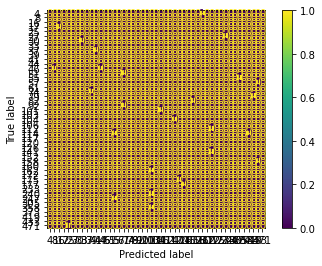

In [61]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(y_test, y_pred)

Text(0, 0.5, 'Mean decrease in impurity')

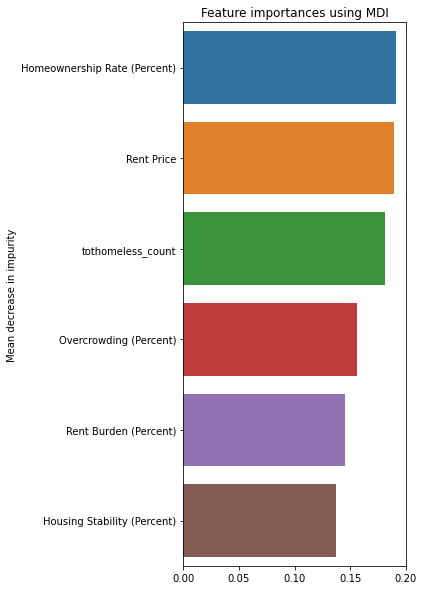

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns

import numpy as np
importances = rf.feature_importances_

forest_importances = pd.Series(importances, index=X_train.columns)

forest_importances.sort_values(inplace=True, ascending=False)

fig, ax = plt.subplots(figsize=(4,10))
sns.barplot(x=forest_importances.values, y=forest_importances.index, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")